# Problem Statement

Cryptocurrency markets are highly volatile, and understanding and forecasting this volatility is crucial for
market participants. Volatility refers to the degree of variation in the price of a cryptocurrency over time, and
high volatility can lead to significant risks for traders and investors. Accurate volatility prediction helps in risk
management, portfolio allocation, and developing trading strategies.


In this project, you are required to build a machine learning model to predict cryptocurrency volatility levels
based on historical market data such as OHLC (Open, High, Low, Close) prices, trading volume, and market
capitalization. The objective is to anticipate periods of heightened volatility, enabling traders and financial
institutions to manage risks and make informed decisions.


Your final model should provide insights into market stability by forecasting volatility variations, allowing
stakeholders to proactively respond to changing market conditions.

#### Dataset Information

You will use a dataset that includes historical daily cryptocurrency price, volume, and market capitalization
data for multiple cryptocurrencies.

Dataset:

The dataset consists of daily records for over 50 cryptocurrencies, including features such as date, symbol,
open, high, low, close, volume, and market cap.

#### Data Preprocessing Require

 Handle missing values and ensure data consistencb

 Normalize and scale numerical feature=

 Engineer new features related to volatility and liquidity trends

#### Project Development Steps

 Data Collection: Gather historical OHLC, volume, and market cap data from the provided dataseg

 Data Preprocessing: Handle missing values, clean data, and normalize numerical feature=

 Exploratory Data Analysis (EDA): Analyze data patterns, trends, and correlation=

 Feature Engineering: Create relevant features such as moving averages, rolling volatility, liquidity ratios (e.g.,
volume/market cap), and technical indicators (e.g., Bollinger Bands, ATRP)

 Model Selection: Choose appropriate machine learning models such as time-series forecasting, regression,
or deep learning approache=

 Model Training: Train the selected model using the processed dataseg

 Model Evaluation: Assess model performance using metrics such as RMSE, MAE, and R² score

#### Model Optimization and DeploymenX

Z Hyperparameter Tuning: Optimize model parameters for better accurac

Z Model Testing & Validation: Test the model on unseen data and analyze prediction

Z Local Deployment: Deploy the trained model locally using Flask or Streamlit for testing

#### Expected Deliverables

1. Machine Learning Model -> 

Z A trained model that predicts cryptocurrency volatility

Z Evaluation metrics showing how well the model performs


2. Data Processing & Feature Engineering

Z Cleaned and prepared dataset

Z A brief explanation of new features added


3. Exploratory Data Analysis (EDA) Report

Z Summary of dataset statistic

Z Basic visualizations (trends, correlations, distributions)


4. Project Documentation

Z High-Level Design (HLD) Document: Overview of system and architecture

Z Low-Level Design (LLD) Document: Breakdown of how each component is implemented

Z Pipeline Architecture: Explanation of data flow from preprocessing to prediction

Z Final Report: A simple summary of findings, model performance, and key insights

#### Guidelines & Submission Requirement

Z Code Documentation: Ensure all scripts are well-commented and easy to follow

Z Report Structure: The report must be structured and should clearly explain the methodology follower

Z Diagrams & Visuals: Use appropriate diagrams and plots to explain datap rocessing, model selection, and
performance evaluation

Z Deployment: If possible, deploy the model using a simple interface (e.g., Streamlit or Flask API) for testing
predictions

#### Submission Format

The project must be submitted as a GitHub repository or a zipped folder containing:

Z Source Code

Z EDA Report

Z HLD & LLD Document

Z Pipeline Architecture and Documentation

Z Final Report

In [1]:
import pandas as pd
from pandas import DataFrame
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
from itertools import cycle
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

from math import sqrt
from sklearn.metrics import mean_squared_error 

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

colors = ["windows blue", "amber", "faded green", "dusty purple"]
sns.set(rc={"figure.figsize": (20,10), "axes.titlesize" : 18, "axes.labelsize" : 12, 
            "xtick.labelsize" : 14, "ytick.labelsize" : 14 })

In [2]:
df = pd.read_csv('dataset.csv')
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

In [3]:
df.head(10)

,open,high,low,close,volume,marketCap,timestamp,crypto_name,date
0,112.900002,118.800003,107.142998,115.910004,0.0,1.288693e+09,2013-05-05T23:59:59.999Z,Bitcoin,2013-05-05
1,3.493130,3.692460,3.346060,3.590890,0.0,6.229819e+07,2013-05-05T23:59:59.999Z,Litecoin,2013-05-05
2,115.980003,124.663002,106.639999,112.300003,0.0,1.249023e+09,2013-05-06T23:59:59.999Z,Bitcoin,2013-05-06
3,3.594220,3.781020,3.116020,3.371250,0.0,5.859436e+07,2013-05-06T23:59:59.999Z,Litecoin,2013-05-06
4,112.250000,113.444000,97.699997,111.500000,0.0,1.240594e+09,2013-05-07T23:59:59.999Z,Bitcoin,2013-05-07
5,3.370870,3.406720,2.939790,3.332740,0.0,5.805127e+07,2013-05-07T23:59:59.999Z,Litecoin,2013-05-07
6,3.283620,3.491120,3.283620,3.409240,0.0,5.950822e+07,2013-05-08T23:59:59.999Z,Litecoin,2013-05-08
7,109.599998,115.779999,109.599998,113.566002,0.0,1.264049e+09,2013-05-08T23:59:59.999Z,Bitcoin,2013-05-08
8,3.399400,3.441690,3.294850,3.416150,0.0,5.975557e+07,2013-05-09T23:59:59.999Z,Litecoin,2013-05-09
9,113.199997,113.459999,109.260002,112.669998,0.0,1.254535e+09,2013-05-09T23:59:59.999Z,Bitcoin,2013-05-09


In [4]:
df.drop(['timestamp'],axis = 1,inplace=True)


In [5]:
df

,open,high,low,close,volume,marketCap,crypto_name,date
0,112.900002,118.800003,107.142998,115.910004,0.000000e+00,1.288693e+09,Bitcoin,2013-05-05
1,3.493130,3.692460,3.346060,3.590890,0.000000e+00,6.229819e+07,Litecoin,2013-05-05
2,115.980003,124.663002,106.639999,112.300003,0.000000e+00,1.249023e+09,Bitcoin,2013-05-06
3,3.594220,3.781020,3.116020,3.371250,0.000000e+00,5.859436e+07,Litecoin,2013-05-06
4,112.250000,113.444000,97.699997,111.500000,0.000000e+00,1.240594e+09,Bitcoin,2013-05-07
...,...,...,...,...,...,...,...,...
72941,0.022604,0.022988,0.022197,0.022796,4.040134e+07,1.652957e+09,VeChain,2022-10-23
72942,1.468244,1.530464,1.435415,1.517878,2.844351e+07,1.572825e+09,Flow,2022-10-23
72943,4.950431,5.148565,4.945280,5.117206,1.069497e+08,1.559551e+09,Filecoin,2022-10-23
72944,0.000233,0.000243,0.000226,0.000239,2.143268e+08,1.576291e+09,Terra Classic,2022-10-23


In [6]:
df['crypto_name'].unique()

array(['Bitcoin', 'Litecoin', 'XRP', 'Dogecoin', 'Monero', 'Stellar',
       'Tether', 'Ethereum', 'Ethereum Classic', 'Maker',
       'Basic Attention Token', 'EOS', 'Bitcoin Cash', 'BNB', 'TRON',
       'Decentraland', 'Chainlink', 'Cardano', 'Filecoin',
       'Theta Network', 'Huobi Token', 'Ravencoin', 'Tezos', 'VeChain',
       'Quant', 'USD Coin', 'Cronos', 'Wrapped Bitcoin', 'Cosmos',
       'Polygon', 'OKB', 'UNUS SED LEO', 'Algorand', 'Chiliz',
       'THORChain', 'Terra Classic', 'FTX Token', 'Hedera', 'Binance USD',
       'Dai', 'Solana', 'Avalanche', 'Shiba Inu', 'The Sandbox',
       'Polkadot', 'Elrond', 'Uniswap', 'Aave', 'NEAR Protocol', 'Flow',
       'Internet Computer', 'Casper', 'Toncoin', 'Chain', 'ApeCoin',
       'Aptos'], dtype=object)

In [7]:
df.isnull().sum()

open           0
high           0
low            0
close          0
volume         0
marketCap      0
crypto_name    0
date           0
dtype: int64

In [8]:
numerical_feature = [feature for feature in df.columns if df[feature].dtype != 'O']
numerical_feature

['open', 'high', 'low', 'close', 'volume', 'marketCap']

In [9]:
categorical_feature = [feature for feature in df.columns if df[feature].dtype == 'O']
categorical_feature

['crypto_name', 'date']

In [10]:
df.describe()

,open,high,low,close,volume,marketCap
count,72946.000000,7.294600e+04,72946.000000,7.294600e+04,7.294600e+04,7.294600e+04
mean,870.194495,8.964124e+02,844.060640,8.712949e+02,2.207607e+09,1.474922e+10
std,5231.654470,5.398613e+03,5079.389387,5.235508e+03,9.617885e+09,7.501159e+10
min,0.000000,1.022100e-10,0.000000,8.292000e-11,0.000000e+00,0.000000e+00
25%,0.167916,1.767999e-01,0.158630,1.682982e-01,8.320618e+06,1.860432e+08
50%,1.630666,1.717542e+00,1.541486,1.640219e+00,1.098756e+08,1.268539e+09
75%,26.070557,2.756868e+01,24.791776,2.625195e+01,6.691398e+08,5.118618e+09
max,67549.735581,1.621883e+05,66458.723733,6.756683e+04,3.509679e+11,1.274831e+12


In [11]:
df

,open,high,low,close,volume,marketCap,crypto_name,date
0,112.900002,118.800003,107.142998,115.910004,0.000000e+00,1.288693e+09,Bitcoin,2013-05-05
1,3.493130,3.692460,3.346060,3.590890,0.000000e+00,6.229819e+07,Litecoin,2013-05-05
2,115.980003,124.663002,106.639999,112.300003,0.000000e+00,1.249023e+09,Bitcoin,2013-05-06
3,3.594220,3.781020,3.116020,3.371250,0.000000e+00,5.859436e+07,Litecoin,2013-05-06
4,112.250000,113.444000,97.699997,111.500000,0.000000e+00,1.240594e+09,Bitcoin,2013-05-07
...,...,...,...,...,...,...,...,...
72941,0.022604,0.022988,0.022197,0.022796,4.040134e+07,1.652957e+09,VeChain,2022-10-23
72942,1.468244,1.530464,1.435415,1.517878,2.844351e+07,1.572825e+09,Flow,2022-10-23
72943,4.950431,5.148565,4.945280,5.117206,1.069497e+08,1.559551e+09,Filecoin,2022-10-23
72944,0.000233,0.000243,0.000226,0.000239,2.143268e+08,1.576291e+09,Terra Classic,2022-10-23


In [12]:
# Create separate datasets for each cryptocurrency
crypto_names = df['crypto_name'].unique()
crypto_datasets = {}

for crypto in crypto_names:
    crypto_datasets[crypto] = df[df['crypto_name'] == crypto].copy()
    print(f"{crypto}: {len(crypto_datasets[crypto])} records")

crypto_datasets

Bitcoin: 3248 records
Litecoin: 3248 records
XRP: 3157 records
Dogecoin: 3024 records
Monero: 2866 records
Stellar: 2791 records
Tether: 2582 records
Ethereum: 2424 records
Ethereum Classic: 2072 records
Maker: 1605 records
Basic Attention Token: 1760 records
EOS: 1730 records
Bitcoin Cash: 1708 records
BNB: 1706 records
TRON: 1656 records
Decentraland: 1652 records
Chainlink: 1649 records
Cardano: 1638 records
Filecoin: 1565 records
Theta Network: 1530 records
Huobi Token: 1513 records
Ravencoin: 1478 records
Tezos: 1365 records
VeChain: 1332 records
Quant: 1325 records
USD Coin: 1266 records
Cronos: 1199 records
Wrapped Bitcoin: 1152 records
Cosmos: 1109 records
Polygon: 1064 records
OKB: 1062 records
UNUS SED LEO: 1041 records
Algorand: 1010 records
Chiliz: 1000 records
THORChain: 978 records
Terra Classic: 975 records
FTX Token: 969 records
Hedera: 922 records
Binance USD: 919 records
Dai: 857 records
Solana: 718 records
Avalanche: 559 records
Shiba Inu: 608 records
The Sandbox: 59

{'Bitcoin':                open          high           low         close        volume  \
 0        112.900002    118.800003    107.142998    115.910004  0.000000e+00   
 2        115.980003    124.663002    106.639999    112.300003  0.000000e+00   
 4        112.250000    113.444000     97.699997    111.500000  0.000000e+00   
 7        109.599998    115.779999    109.599998    113.566002  0.000000e+00   
 9        113.199997    113.459999    109.260002    112.669998  0.000000e+00   
 ...             ...           ...           ...           ...           ...   
 72692  18936.311515  19134.733194  18696.468304  18802.097976  2.335997e+10   
 72752  19311.848708  19370.309281  18970.620583  19044.107272  2.076596e+10   
 72815  19417.479411  19542.538654  19349.258953  19446.426194  1.683726e+10   
 72845  19068.913560  19389.603520  19068.913560  19268.092801  1.798892e+10   
 72912  19207.734651  19646.651542  19124.196965  19567.007398  2.212879e+10   
 
           marketCap crypto

In [13]:
crypto_datasets.keys()

dict_keys(['Bitcoin', 'Litecoin', 'XRP', 'Dogecoin', 'Monero', 'Stellar', 'Tether', 'Ethereum', 'Ethereum Classic', 'Maker', 'Basic Attention Token', 'EOS', 'Bitcoin Cash', 'BNB', 'TRON', 'Decentraland', 'Chainlink', 'Cardano', 'Filecoin', 'Theta Network', 'Huobi Token', 'Ravencoin', 'Tezos', 'VeChain', 'Quant', 'USD Coin', 'Cronos', 'Wrapped Bitcoin', 'Cosmos', 'Polygon', 'OKB', 'UNUS SED LEO', 'Algorand', 'Chiliz', 'THORChain', 'Terra Classic', 'FTX Token', 'Hedera', 'Binance USD', 'Dai', 'Solana', 'Avalanche', 'Shiba Inu', 'The Sandbox', 'Polkadot', 'Elrond', 'Uniswap', 'Aave', 'NEAR Protocol', 'Flow', 'Internet Computer', 'Casper', 'Toncoin', 'Chain', 'ApeCoin', 'Aptos'])

In [14]:
crypto_datasets['Bitcoin']

,open,high,low,close,volume,marketCap,crypto_name,date
0,112.900002,118.800003,107.142998,115.910004,0.000000e+00,1.288693e+09,Bitcoin,2013-05-05
2,115.980003,124.663002,106.639999,112.300003,0.000000e+00,1.249023e+09,Bitcoin,2013-05-06
4,112.250000,113.444000,97.699997,111.500000,0.000000e+00,1.240594e+09,Bitcoin,2013-05-07
7,109.599998,115.779999,109.599998,113.566002,0.000000e+00,1.264049e+09,Bitcoin,2013-05-08
9,113.199997,113.459999,109.260002,112.669998,0.000000e+00,1.254535e+09,Bitcoin,2013-05-09
...,...,...,...,...,...,...,...,...
72692,18936.311515,19134.733194,18696.468304,18802.097976,2.335997e+10,3.602593e+11,Bitcoin,2022-09-25
72752,19311.848708,19370.309281,18970.620583,19044.107272,2.076596e+10,3.650248e+11,Bitcoin,2022-10-02
72815,19417.479411,19542.538654,19349.258953,19446.426194,1.683726e+10,3.728768e+11,Bitcoin,2022-10-09
72845,19068.913560,19389.603520,19068.913560,19268.092801,1.798892e+10,3.695843e+11,Bitcoin,2022-10-16


In [15]:
Bitcoin = crypto_datasets['Bitcoin']
Bitcoin['Prediction'] = Bitcoin[['close']]
Bitcoin

,open,high,low,close,volume,marketCap,crypto_name,date,Prediction
0,112.900002,118.800003,107.142998,115.910004,0.000000e+00,1.288693e+09,Bitcoin,2013-05-05,115.910004
2,115.980003,124.663002,106.639999,112.300003,0.000000e+00,1.249023e+09,Bitcoin,2013-05-06,112.300003
4,112.250000,113.444000,97.699997,111.500000,0.000000e+00,1.240594e+09,Bitcoin,2013-05-07,111.500000
7,109.599998,115.779999,109.599998,113.566002,0.000000e+00,1.264049e+09,Bitcoin,2013-05-08,113.566002
9,113.199997,113.459999,109.260002,112.669998,0.000000e+00,1.254535e+09,Bitcoin,2013-05-09,112.669998
...,...,...,...,...,...,...,...,...,...
72692,18936.311515,19134.733194,18696.468304,18802.097976,2.335997e+10,3.602593e+11,Bitcoin,2022-09-25,18802.097976
72752,19311.848708,19370.309281,18970.620583,19044.107272,2.076596e+10,3.650248e+11,Bitcoin,2022-10-02,19044.107272
72815,19417.479411,19542.538654,19349.258953,19446.426194,1.683726e+10,3.728768e+11,Bitcoin,2022-10-09,19446.426194
72845,19068.913560,19389.603520,19068.913560,19268.092801,1.798892e+10,3.695843e+11,Bitcoin,2022-10-16,19268.092801


In [16]:
visualize_Bitcoin = cycle(['Open','Close','High','Low','Prediction'])

fig = px.line(Bitcoin, x=Bitcoin.date, y=[Bitcoin['open'], Bitcoin['close'], 
                                          Bitcoin['high'], Bitcoin['low'], Bitcoin['Prediction']],
             labels={'Date': 'Date','value':'Price'})
fig.update_layout(title_text='Bitcoin', font_size=15, font_color='black',legend_title_text='Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(visualize_Bitcoin)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

In [21]:
# Loop through all cryptocurrencies and create visualizations
for crypto_name in crypto_names:
    crypto_data = crypto_datasets[crypto_name].copy()
    crypto_data['Prediction'] = crypto_data[['close']]
    
    visualize_crypto = cycle(['Open', 'Close', 'High', 'Low', 'Prediction'])
    
    fig = px.line(crypto_data, x=crypto_data.date, 
                  y=[crypto_data['open'], crypto_data['close'], 
                     crypto_data['high'], crypto_data['low'], crypto_data['Prediction']],
                  labels={'Date': 'Date', 'value': 'Price'})
    
    fig.update_layout(title_text=crypto_name, font_size=15, font_color='black', 
                     legend_title_text='Parameters')
    fig.for_each_trace(lambda t: t.update(name=next(visualize_crypto)))
    fig.update_xaxes(showgrid=False)
    fig.update_yaxes(showgrid=False)
    
    fig.show()

In [22]:
df.columns

Index(['open', 'high', 'low', 'close', 'volume', 'marketCap', 'crypto_name',
       'date'],
      dtype='object')

               open      high       low     close    volume  marketCap
open       1.000000  0.997202  0.999396  0.999227  0.266756   0.670421
high       0.997202  1.000000  0.996678  0.996989  0.266207   0.667033
low        0.999396  0.996678  1.000000  0.999572  0.264726   0.670297
close      0.999227  0.996989  0.999572  1.000000  0.266575   0.670958
volume     0.266756  0.266207  0.264726  0.266575  1.000000   0.463637
marketCap  0.670421  0.667033  0.670297  0.670958  0.463637   1.000000


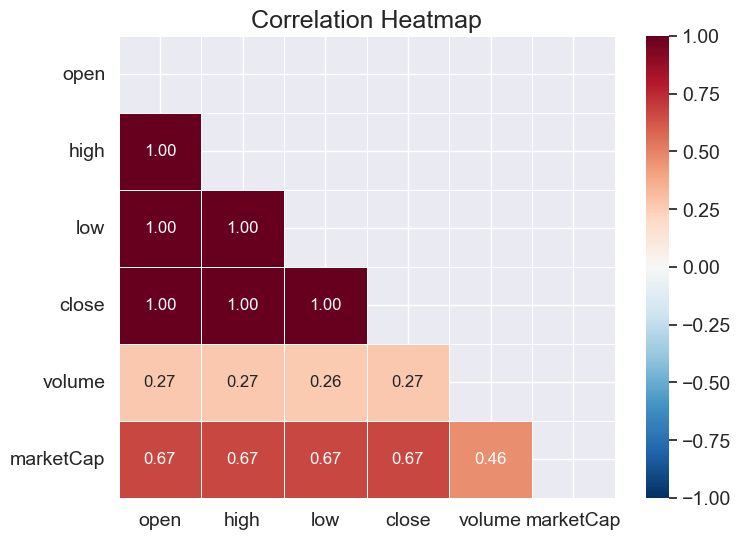

In [43]:
# correlation and heatmap for numerical features
corr = df[numerical_feature].corr()
print(corr)

plt.figure(figsize=(8,6))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='RdBu_r', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

<Axes: xlabel='crypto_name', ylabel='Count'>

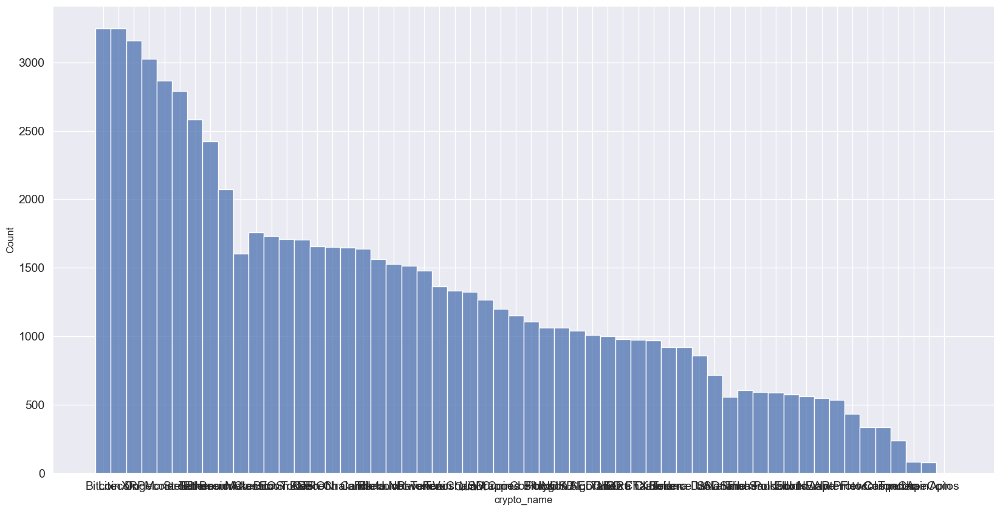

In [35]:
# plot distribution of marketCap
sns.histplot(data=df, x='crypto_name')

In [39]:
df['Prediction'] = df[['close']]
df

,open,high,low,close,volume,marketCap,crypto_name,date,Prediction
0,112.900002,118.800003,107.142998,115.910004,0.000000e+00,1.288693e+09,Bitcoin,2013-05-05,115.910004
1,3.493130,3.692460,3.346060,3.590890,0.000000e+00,6.229819e+07,Litecoin,2013-05-05,3.590890
2,115.980003,124.663002,106.639999,112.300003,0.000000e+00,1.249023e+09,Bitcoin,2013-05-06,112.300003
3,3.594220,3.781020,3.116020,3.371250,0.000000e+00,5.859436e+07,Litecoin,2013-05-06,3.371250
4,112.250000,113.444000,97.699997,111.500000,0.000000e+00,1.240594e+09,Bitcoin,2013-05-07,111.500000
...,...,...,...,...,...,...,...,...,...
72941,0.022604,0.022988,0.022197,0.022796,4.040134e+07,1.652957e+09,VeChain,2022-10-23,0.022796
72942,1.468244,1.530464,1.435415,1.517878,2.844351e+07,1.572825e+09,Flow,2022-10-23,1.517878
72943,4.950431,5.148565,4.945280,5.117206,1.069497e+08,1.559551e+09,Filecoin,2022-10-23,5.117206
72944,0.000233,0.000243,0.000226,0.000239,2.143268e+08,1.576291e+09,Terra Classic,2022-10-23,0.000239


In [41]:
# create mapping dict and assign numeric id to each crypto
mapping = {name: idx for idx, name in enumerate(crypto_names, start=1)}

# add column to main df
df['crypto_id'] = df['crypto_name'].map(mapping)

# add column to each per-crypto dataset
for name, data in crypto_datasets.items():
    crypto_datasets[name]['crypto_id'] = data['crypto_name'].map(mapping)

# inspect
print(dict(list(mapping.items())[:20]))   # sample of mapping
df[['crypto_name','crypto_id']].drop_duplicates().head()

{'Bitcoin': 1, 'Litecoin': 2, 'XRP': 3, 'Dogecoin': 4, 'Monero': 5, 'Stellar': 6, 'Tether': 7, 'Ethereum': 8, 'Ethereum Classic': 9, 'Maker': 10, 'Basic Attention Token': 11, 'EOS': 12, 'Bitcoin Cash': 13, 'BNB': 14, 'TRON': 15, 'Decentraland': 16, 'Chainlink': 17, 'Cardano': 18, 'Filecoin': 19, 'Theta Network': 20}


,crypto_name,crypto_id
0,Bitcoin,1
1,Litecoin,2
183,XRP,3
581,Dogecoin,4
1211,Monero,5


In [42]:
# convert all df features to numeric dtype

# map crypto_name to numeric id if mapping exists
if 'mapping' in globals() and 'crypto_name' in df.columns:
    df['crypto_name'] = df['crypto_name'].map(mapping)

# convert date to unix timestamp (seconds)
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'], errors='coerce')
    df['date'] = df['date'].astype('int64') // 10**9

# coerce any remaining object columns to numeric
for col in df.columns:
    if df[col].dtype == 'object':
        df[col] = pd.to_numeric(df[col], errors='coerce')

# fill numeric NaNs with column median
num_cols = df.select_dtypes(include=[np.number]).columns
df[num_cols] = df[num_cols].apply(lambda s: s.fillna(s.median()))

# show result
print(df.dtypes)
df.head()

open           float64
high           float64
low            float64
close          float64
volume         float64
marketCap      float64
crypto_name      int64
date             int64
Prediction     float64
crypto_id        int64
dtype: object


,open,high,low,close,volume,marketCap,crypto_name,date,Prediction,crypto_id
0,112.900002,118.800003,107.142998,115.910004,0.0,1.288693e+09,1,1367712000,115.910004,1
1,3.493130,3.692460,3.346060,3.590890,0.0,6.229819e+07,2,1367712000,3.590890,2
2,115.980003,124.663002,106.639999,112.300003,0.0,1.249023e+09,1,1367798400,112.300003,1
3,3.594220,3.781020,3.116020,3.371250,0.0,5.859436e+07,2,1367798400,3.371250,2
4,112.250000,113.444000,97.699997,111.500000,0.0,1.240594e+09,1,1367884800,111.500000,1


In [46]:
df.drop('crypto_id',axis=1,inplace=True)

                 open      high       low     close    volume  marketCap  \
open         1.000000  0.997202  0.999396  0.999227  0.266756   0.670421   
high         0.997202  1.000000  0.996678  0.996989  0.266207   0.667033   
low          0.999396  0.996678  1.000000  0.999572  0.264726   0.670297   
close        0.999227  0.996989  0.999572  1.000000  0.266575   0.670958   
volume       0.266756  0.266207  0.264726  0.266575  1.000000   0.463637   
marketCap    0.670421  0.667033  0.670297  0.670958  0.463637   1.000000   
crypto_name -0.065877 -0.065359 -0.065782 -0.065907 -0.173268  -0.161083   
date         0.099145  0.098736  0.099297  0.099117  0.130945   0.116444   
Prediction   0.999227  0.996989  0.999572  1.000000  0.266575   0.670958   

             crypto_name      date  Prediction  
open           -0.065877  0.099145    0.999227  
high           -0.065359  0.098736    0.996989  
low            -0.065782  0.099297    0.999572  
close          -0.065907  0.099117    1.000

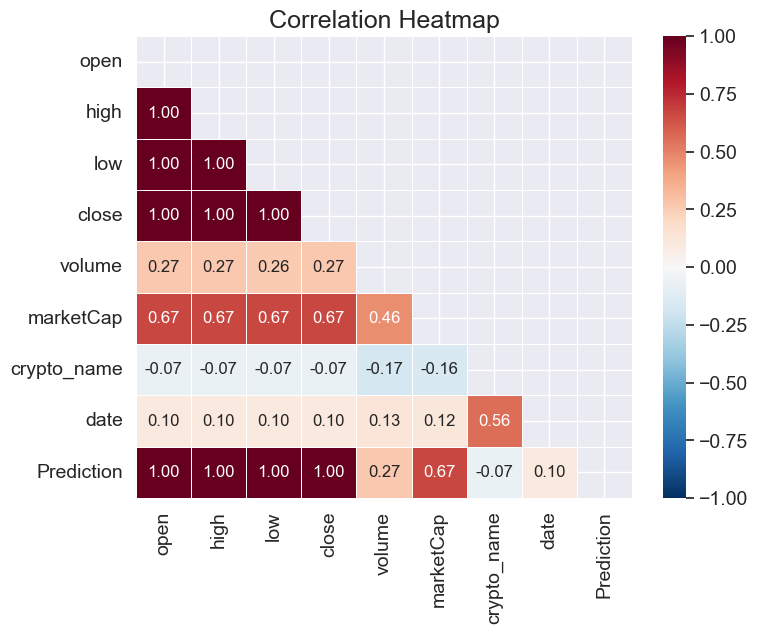

In [47]:
# correlation and heatmap for numerical features
corr = df.corr()
print(corr)

plt.figure(figsize=(8,6))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='RdBu_r', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [52]:
# Feature engineering: moving averages, rolling volatility, liquidity ratio, Bollinger Bands, ATR & ATRP
ma_windows = [7, 14, 21, 30]
vol_windows = [7, 14, 21, 30]
bb_window = 20
atr_window = 14

def engineer_features(df_group):
    g = df_group.sort_values('date').copy()
    # returns
    g['return'] = g['close'].pct_change()
    # moving averages
    for w in ma_windows:
        g[f'ma_{w}'] = g['close'].rolling(window=w, min_periods=1).mean()
    # rolling volatility (std of returns)
    for w in vol_windows:
        g[f'vol_std_{w}'] = g['return'].rolling(window=w, min_periods=1).std()
    # liquidity ratio
    g['liquidity'] = g['volume'] / (g['marketCap'].replace({0: np.nan}))
    # Bollinger Bands (window=20)
    g['bb_ma'] = g['close'].rolling(window=bb_window, min_periods=1).mean()
    g['bb_std'] = g['close'].rolling(window=bb_window, min_periods=1).std()

In [54]:
def engineer_features(df_group):
    g = df_group.sort_values('date').copy()
    # returns
    g['return'] = g['close'].pct_change()
    # moving averages
    for w in ma_windows:
        g[f'ma_{w}'] = g['close'].rolling(window=w, min_periods=1).mean()
    # rolling volatility (std of returns)
    for w in vol_windows:
        g[f'vol_std_{w}'] = g['return'].rolling(window=w, min_periods=1).std()
    # liquidity ratio
    g['liquidity'] = g['volume'] / (g['marketCap'].replace({0: np.nan}))
    # Bollinger Bands
    g['bb_ma'] = g['close'].rolling(window=bb_window, min_periods=1).mean()
    g['bb_std'] = g['close'].rolling(window=bb_window, min_periods=1).std()
    g['bb_upper'] = g['bb_ma'] + 2 * g['bb_std']
    g['bb_lower'] = g['bb_ma'] - 2 * g['bb_std']
    g['bb_bw'] = (g['bb_upper'] - g['bb_lower']) / g['bb_ma']
    # ATR & ATRP
    g['prev_close'] = g['close'].shift(1)
    g['tr1'] = g['high'] - g['low']
    g['tr2'] = (g['high'] - g['prev_close']).abs()
    g['tr3'] = (g['low'] - g['prev_close']).abs()
    g['tr'] = g[['tr1', 'tr2', 'tr3']].max(axis=1)
    g['atr'] = g['tr'].rolling(window=atr_window, min_periods=1).mean()
    g['atrp'] = g['atr'] / g['close']
    # extra simple features
    g['range_pct'] = (g['high'] - g['low']) / g['low'].replace({0: np.nan})
    g['day_return'] = (g['close'] - g['open']) / g['open'].replace({0: np.nan})
    # clean numeric columns
    num_cols = g.select_dtypes(include=[np.number]).columns
    g[num_cols] = g[num_cols].replace([np.inf, -np.inf], np.nan)
    g[num_cols] = g[num_cols].fillna(method='ffill').fillna(method='bfill').fillna(0)
    # drop helper cols
    g.drop(['prev_close', 'tr1', 'tr2', 'tr3', 'tr'], axis=1, inplace=True, errors='ignore')
    return g

# Apply feature engineering to main dataframe and per-crypto datasets
df = df.groupby('crypto_name', group_keys=False).apply(engineer_features).reset_index(drop=True)
for name in list(crypto_datasets.keys()):
    crypto_datasets[name] = engineer_features(crypto_datasets[name])

In [55]:
df


,open,high,low,close,volume,marketCap,crypto_name,date,Prediction,return,...,liquidity,bb_ma,bb_std,bb_upper,bb_lower,bb_bw,atr,atrp,range_pct,day_return
0,112.900002,118.800003,107.142998,115.910004,0.000000e+00,1.288693e+09,1,1367712000,115.910004,-0.031145,...,0.000000,115.910004,2.552656,119.210315,108.999692,0.089484,11.657005,0.100569,0.108799,0.026661
1,3.493130,3.692460,3.346060,3.590890,0.000000e+00,6.229819e+07,2,1367712000,3.590890,-0.061166,...,0.000000,3.590890,0.155309,3.791688,3.170452,0.178461,0.346400,0.096466,0.103525,0.027986
2,115.980003,124.663002,106.639999,112.300003,0.000000e+00,1.249023e+09,1,1367798400,112.300003,-0.031145,...,0.000000,114.105003,2.552656,119.210315,108.999692,0.089484,14.840004,0.132146,0.169008,-0.031730
3,3.594220,3.781020,3.116020,3.371250,0.000000e+00,5.859436e+07,2,1367798400,3.371250,-0.061166,...,0.000000,3.481070,0.155309,3.791688,3.170452,0.178461,0.505700,0.150004,0.213413,-0.062036
4,112.250000,113.444000,97.699997,111.500000,0.000000e+00,1.240594e+09,1,1367884800,111.500000,-0.007124,...,0.000000,113.236669,2.349477,117.935622,108.537716,0.082993,15.141337,0.135797,0.161146,-0.006682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72941,0.022604,0.022988,0.022197,0.022796,4.040134e+07,1.652957e+09,24,1666483200,0.022796,-0.005835,...,0.024442,0.025773,0.003366,0.032504,0.019041,0.522356,0.001340,0.058790,0.035635,0.008500
72942,1.468244,1.530464,1.435415,1.517878,2.844351e+07,1.572825e+09,50,1666483200,1.517878,0.013369,...,0.018084,2.026994,0.450247,2.927487,1.126500,0.888501,0.194393,0.128069,0.066217,0.033805
72943,4.950431,5.148565,4.945280,5.117206,1.069497e+08,1.559551e+09,19,1666483200,5.117206,-0.006963,...,0.068577,6.512859,1.317017,9.146893,3.878824,0.808872,0.484352,0.094652,0.041107,0.033689
72944,0.000233,0.000243,0.000226,0.000239,2.143268e+08,1.576291e+09,36,1666483200,0.000239,-0.091161,...,0.135969,0.000212,0.000111,0.000434,-0.000011,2.104279,0.000077,0.320077,0.075362,0.028485


                 open      high       low     close    volume  marketCap  \
open         1.000000  0.997202  0.999396  0.999227  0.266756   0.670421   
high         0.997202  1.000000  0.996678  0.996989  0.266207   0.667033   
low          0.999396  0.996678  1.000000  0.999572  0.264726   0.670297   
close        0.999227  0.996989  0.999572  1.000000  0.266575   0.670958   
volume       0.266756  0.266207  0.264726  0.266575  1.000000   0.463637   
marketCap    0.670421  0.667033  0.670297  0.670958  0.463637   1.000000   
crypto_name -0.065877 -0.065359 -0.065782 -0.065907 -0.173268  -0.161083   
date         0.099145  0.098736  0.099297  0.099117  0.130945   0.116444   
Prediction   0.999227  0.996989  0.999572  1.000000  0.266575   0.670958   
return      -0.001693 -0.001496 -0.001481 -0.001313 -0.000946  -0.001402   
ma_7         0.998796  0.996287  0.998204  0.998261  0.266977   0.669812   
ma_14        0.996539  0.994006  0.995832  0.995876  0.265853   0.668223   
ma_21       

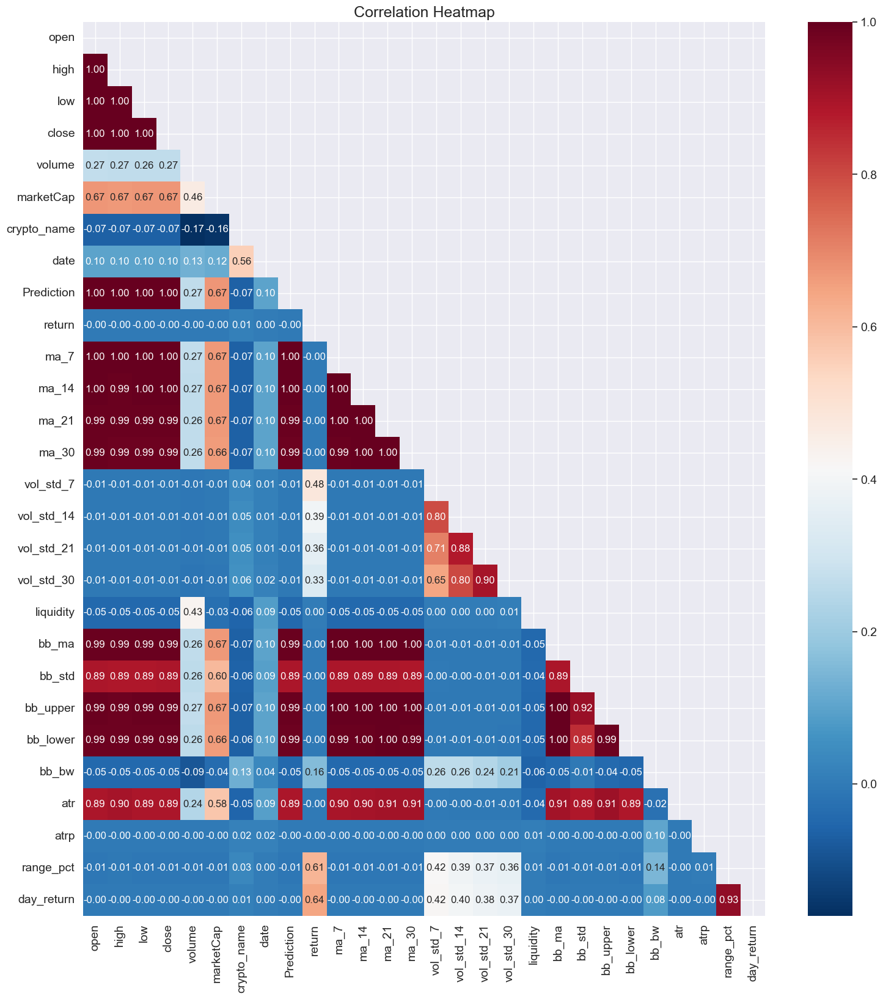

In [58]:
# correlation and heatmap for numerical features
corr = df.corr()
print(corr)

plt.figure(figsize=(18,19))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='RdBu_r')
plt.title('Correlation Heatmap')
plt.show()

In [59]:
X = df.drop('Prediction',axis=1)
y = df.Prediction
y,X

(0        115.910004
 1          3.590890
 2        112.300003
 3          3.371250
 4        111.500000
             ...    
 72941      0.022796
 72942      1.517878
 72943      5.117206
 72944      0.000239
 72945      0.469033
 Name: Prediction, Length: 72946, dtype: float64,
              open        high         low       close        volume  \
 0      112.900002  118.800003  107.142998  115.910004  0.000000e+00   
 1        3.493130    3.692460    3.346060    3.590890  0.000000e+00   
 2      115.980003  124.663002  106.639999  112.300003  0.000000e+00   
 3        3.594220    3.781020    3.116020    3.371250  0.000000e+00   
 4      112.250000  113.444000   97.699997  111.500000  0.000000e+00   
 ...           ...         ...         ...         ...           ...   
 72941    0.022604    0.022988    0.022197    0.022796  4.040134e+07   
 72942    1.468244    1.530464    1.435415    1.517878  2.844351e+07   
 72943    4.950431    5.148565    4.945280    5.117206  1.069497e+08   

In [60]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=42)

In [66]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

models = {
    "LinearRegression": LinearRegression(),
    "Ridge": Ridge(random_state=42),
    "Lasso": Lasso(random_state=42),
    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
    "GradientBoosting": GradientBoostingRegressor(n_estimators=100, random_state=42)
}

results = {}
for name, estimator in models.items():
    pipe = Pipeline([("scaler", StandardScaler()), ("model", estimator)])
    pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    results[name] = {"mse": mse, "rmse": rmse, "r2": r2}
    print(f"{name}: MSE={mse:.4f}, RMSE={rmse:.4f}, R2={r2:.4f}")

LinearRegression: MSE=0.0000, RMSE=0.0000, R2=1.0000
Ridge: MSE=16.9554, RMSE=4.1177, R2=1.0000
Lasso: MSE=5587.3847, RMSE=74.7488, R2=0.9998
RandomForest: MSE=1313.6093, RMSE=36.2437, R2=1.0000
GradientBoosting: MSE=1157.4604, RMSE=34.0215, R2=1.0000


In [80]:
import os, shutil, re
from IPython.display import FileLink, display

out_dir = "latest_datasets"
os.makedirs(out_dir, exist_ok=True)

# Save main dataframe
df.to_csv(os.path.join(out_dir, "full_dataset.csv"), index=False)

# Save per-crypto datasets if available
if 'crypto_datasets' in globals():
    for name, data in crypto_datasets.items():
        safe = re.sub(r'[^0-9A-Za-z_-]+', '_', str(name))
        data.to_csv(os.path.join(out_dir, f"{safe}.csv"), index=False)

# Create zip archive for download
shutil.make_archive(out_dir, "zip", out_dir)

# Display download link
display(FileLink(out_dir + ".zip"))

d:\Programmer\Data Science\Assignments\latest_datasets.zip

In [68]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error
import joblib
import json
import streamlit as st
import pandas as pd
import joblib

# Hyperparameter tuning, evaluation, and simple Streamlit deployment writer
import streamlit as st  # only needed for generating the app file text; not run here

# Parameter distributions
rf_param_dist = {
    "model__n_estimators": [100, 200, 300],
    "model__max_depth": [None, 5, 10, 20],
    "model__min_samples_split": [2, 5, 10],
    "model__min_samples_leaf": [1, 2, 4],
    "model__max_features": ["auto", "sqrt", "log2"]
}
gb_param_dist = {
    "model__n_estimators": [100, 200, 300],
    "model__learning_rate": [0.01, 0.05, 0.1],
    "model__max_depth": [3, 5, 8],
    "model__min_samples_split": [2, 5, 10],
    "model__subsample": [0.6, 0.8, 1.0]
}

searches = {}
for name, estimator, param_dist in [
    ("RandomForest", models["RandomForest"], rf_param_dist),
    ("GradientBoosting", models["GradientBoosting"], gb_param_dist)
]:
    pipe = Pipeline([("scaler", StandardScaler()), ("model", estimator)])
    rs = RandomizedSearchCV(
        pipe, param_distributions=param_dist, n_iter=20, cv=3,
        scoring="neg_mean_squared_error", n_jobs=-1, random_state=42, verbose=0
    )
    rs.fit(X_train, y_train)
    best = rs.best_estimator_
    y_pred = best.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    searches[name] = {"search": rs, "best_estimator": best, "mse": mse, "mae": mae, "r2": r2}
    print(f"{name} best MSE={mse:.4f}, MAE={mae:.4f}, R2={r2:.6f}")

# Choose best model by MSE
best_name = min(searches, key=lambda k: searches[k]["mse"])
best_model = searches[best_name]["best_estimator"]
print(f"Selected best model: {best_name}")

# Save model + feature list
feature_names = list(X.columns)
joblib.dump({"model": best_model, "features": feature_names}, "model_bundle.pkl")
print("Saved model_bundle.pkl")

# Write a minimal Streamlit app to app.py that loads model_bundle.pkl and predicts for uploaded CSV
app_code = f'''

st.title("Crypto Volatility Predictor (batch CSV)")

bundle = joblib.load("model_bundle.pkl")
model = bundle["model"]
features = bundle["features"]

uploaded = st.file_uploader("Upload CSV with feature columns", type=["csv"])
if uploaded is not None:
    df = pd.read_csv(uploaded)
    missing = [c for c in features if c not in df.columns]
    if missing:
        st.error(f"Missing required columns: {{missing}}")
    else:
        X_in = df[features].copy()
        preds = model.predict(X_in)
        df["prediction"] = preds
        st.write(df.head(50))
        st.download_button("Download predictions CSV", df.to_csv(index=False).encode("utf-8"), "predictions.csv")
else:
    st.info("Upload a CSV file containing the same feature columns used for training.")
'''

with open("app.py", "w", encoding="utf-8") as f:
    f.write(app_code)
print("Wrote app.py (run with: streamlit run app.py)")

RandomForest best MSE=6499.4394, MAE=8.5351, R2=0.999769
GradientBoosting best MSE=368.1025, MAE=0.8788, R2=0.999987
Selected best model: GradientBoosting
Saved model_bundle.pkl
Wrote app.py (run with: streamlit run app.py)


Crypto: Aptos
Rows: 3248 | Strategy Total Return: 91060.96% | Annualized: 115.09%
Max Drawdown: -64.47% | Trades: 79 | Win rate: 45.57%


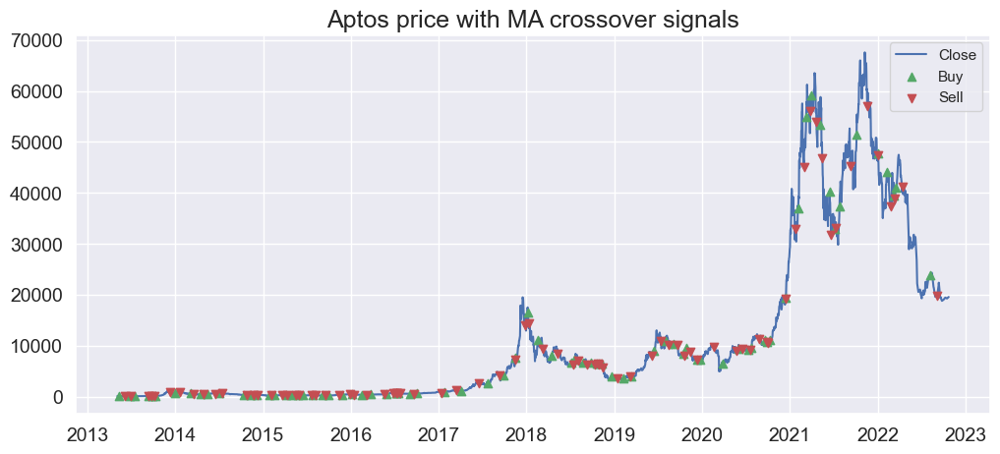

In [79]:
# Robust backtest that handles short history (works with existing `crypto` and `crypto_datasets`)
# fix: use the crypto name (string) to fetch from crypto_datasets, not the dict itself
hist = crypto_datasets.get('Bitcoin')
if hist is None:
    raise ValueError(f"No dataset found for crypto '{'Bitcoin'}'")

hist = hist.sort_values('date').reset_index(drop=True).copy()
n = len(hist)
if n < 10:
    print(f"Warning: only {n} rows available — running best-effort backtest (metrics will be limited).")

# compute short & long MAs (use engineered if present)
short_col = 'ma_7' if 'ma_7' in hist.columns else 'close'
long_col = 'ma_21' if 'ma_21' in hist.columns else 'close'
hist['ma_short'] = hist[short_col].rolling(7, min_periods=1).mean() if short_col == 'close' else hist[short_col]
hist['ma_long']  = hist[long_col].rolling(21, min_periods=1).mean() if long_col == 'close' else hist[long_col]

# signals and returns
hist['signal'] = (hist['ma_short'] > hist['ma_long']).astype(int)
hist['signal_shifted'] = hist['signal'].shift(1).fillna(0)  # position applied for next day
hist['daily_ret'] = hist['close'].pct_change().fillna(0)
hist['strat_ret'] = hist['daily_ret'] * hist['signal_shifted']

# performance
cum_ret = (1 + hist['strat_ret']).cumprod() - 1
total_return = float(cum_ret.iloc[-1]) if n > 0 else 0.0
annualized_return = (1 + total_return) ** (365.0 / n) - 1 if n > 1 else 0.0
running_max = (1 + hist['strat_ret']).cumprod().cummax() if n > 0 else pd.Series([1.0])
drawdown = (1 + hist['strat_ret']).cumprod() / running_max - 1 if n > 0 else pd.Series([0.0])
max_drawdown = float(drawdown.min()) if n > 0 else 0.0

# trades
hist['sig_change'] = hist['signal'].diff().fillna(0)
entries = hist.index[hist['sig_change'] == 1].tolist()
exits = hist.index[hist['sig_change'] == -1].tolist()
if len(entries) > len(exits):
    exits.append(len(hist) - 1)
trade_returns = []
for e, x in zip(entries, exits):
    if e < x:
        start_price = hist.loc[e, 'close']
        end_price = hist.loc[x, 'close']
        if start_price != 0:
            trade_returns.append(end_price / start_price - 1)
win_rate = (sum(1 for r in trade_returns if r > 0) / len(trade_returns) * 100) if trade_returns else 0.0
num_trades = len(trade_returns)

# concise summary
print(f"Crypto: {crypto}")
print(f"Rows: {n} | Strategy Total Return: {total_return:.2%} | Annualized: {annualized_return:.2%}")
print(f"Max Drawdown: {max_drawdown:.2%} | Trades: {num_trades} | Win rate: {win_rate:.2f}%")

# plotting (safe date conversion)
def _to_datetime(s):
    try:
        if np.issubdtype(s.dtype, np.number):
            return pd.to_datetime(s, unit='s', origin='unix')
        return pd.to_datetime(s)
    except Exception:
        return pd.to_datetime(s.astype(str))

import matplotlib.pyplot as plt
plt.figure(figsize=(12,5))
dates = _to_datetime(hist['date'])
plt.plot(dates, hist['close'], label='Close')
buys = hist[hist['sig_change'] == 1]
sells = hist[hist['sig_change'] == -1]
if not buys.empty:
    plt.scatter(_to_datetime(buys['date']), buys['close'], marker='^', color='g', label='Buy', zorder=5)
if not sells.empty:
    plt.scatter(_to_datetime(sells['date']), sells['close'], marker='v', color='r', label='Sell', zorder=5)
plt.title(f"{crypto} price with MA crossover signals")
plt.legend(); plt.show()